# 공사장 안전을 위한 안전모 탐지 모델

## 용도
```
1. 안전모를 착용, 미착용 구분
2. 안전모 미착용 시 경보를 울리게 하여 사고 발생 위험도 감소
```

### 환경 설정

In [1]:
import torch
import yaml
from glob import glob
import random
from IPython.display import Image, display
from IPython.core.magic import register_line_cell_magic

## YOLOv5 Clone

In [2]:
%cd /content
%pwd

/content


'/content'

In [3]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16575, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 16575 (delta 28), reused 37 (delta 18), pack-reused 16522
Receiving objects: 100% (16575/16575), 15.03 MiB | 13.59 MiB/s, done.
Resolving deltas: 100% (11387/11387), done.


In [4]:
%cd yolov5

/content/yolov5


## 데이터셋 다운로드

In [5]:
# 데이터셋을 다운로드 받을 폴더 생성

%mkdir /content/yolov5/hardhat
%cd /content/yolov5/hardhat

/content/yolov5/hardhat


In [6]:
# roboflow에서 데이터셋 받아오기
!curl -L "https://public.roboflow.com/ds/5L1ISdncRk?key=3dGsiPZXpL" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/labels/000560_jpg.rf.0c7bf997f0ccb3aa4666aae7bacd15e1.txt  
 extracting: train/labels/002296_jpg.rf.0c9e2f0756e58251ba576c4799a52013.txt  
 extracting: train/labels/000135_jpg.rf.0ca2fda801cbc26acad48a4970d5fd9c.txt  
 extracting: train/labels/000927_jpg.rf.0c8662a3294885b1dce0b9c9f71bf63d.txt  
 extracting: train/labels/003070_jpg.rf.0d4f1aa374695130ec80a94eb7d3029f.txt  
 extracting: train/labels/004879_jpg.rf.0d5c27700ff04fb911be2cc0b0ae7e44.txt  
 extracting: train/labels/000307_jpg.rf.0da33908e280d7c9d61d7cb6470ecd3f.txt  
 extracting: train/labels/005099_jpg.rf.0de8be5e21e09352a246b6c1faf53ecc.txt  
 extracting: train/labels/004482_jpg.rf.0d541b29bd4b4ededc19b5cafebb4fe9.txt  
 extracting: train/labels/000735_jpg.rf.0d5b96188e544511c13ac1e1bfff0b87.txt  
 extracting: train/labels/001653_jpg.rf.0cc3a72fd244aa7aadee6c4d766190df.txt  
 extracting: train/labels/002922_jpg.rf.0d24f020d6f688f966ef38c7a0eeba3e.txt  
 extracting: tra

In [7]:
# 데이터 전처리 (학습, 테스트, 검증 데이터셋으로 나누기)
train_img_list = glob('/content/yolov5/hardhat/train/images/*.jpg')
test_img_list = glob('/content/yolov5/hardhat/test/images/*.jpg')
print(len(train_img_list), len(test_img_list))

5269 1766


## 전이 학습

In [8]:
with open('/content/yolov5/hardhat/train.txt','w') as f:
    f.write('\n'.join(train_img_list) + '\n')
with open('/content/yolov5/hardhat/test.txt','w') as f:
    f.write('\n'.join(test_img_list) + '\n')

In [9]:
@register_line_cell_magic
def writetemplate(line,cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

## 전이 학습에 필요한 data.yaml 지정 + custom_model 생성

In [10]:
%%writetemplate /content/yolov5/hardhat/data.yaml

train: ./hardhat/train/images
test: ./hardhat/test/images
val : ""

nc: 3
names: ['head', 'helmet', 'person']

In [11]:
%cat /content/yolov5/hardhat/data.yaml


train: ./hardhat/train/images
test: ./hardhat/test/images
val : ""

nc: 3
names: ['head', 'helmet', 'person']


In [12]:
with open('/content/yolov5/hardhat/data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [13]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [14]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

## 학습(Training)

In [15]:
%%time
%cd /content/yolov5

/content/yolov5
CPU times: user 205 µs, sys: 1.03 ms, total: 1.23 ms
Wall time: 1.54 ms


In [18]:
%rm /content/yolov5/hardhat/train/labels.cache

In [19]:
!python /content/yolov5/train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/hardhat/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name hardhat_result --cache disk

2024-05-02 00:11:43.511989: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-02 00:11:43.512038: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-02 00:11:43.513350: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=/content/yolov5/hardhat/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=disk, image_weights=Fa

In [20]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [21]:
!ls /content/yolov5/runs/train/hardhat_result2/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1714608706.2aeceedf643d.1217.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


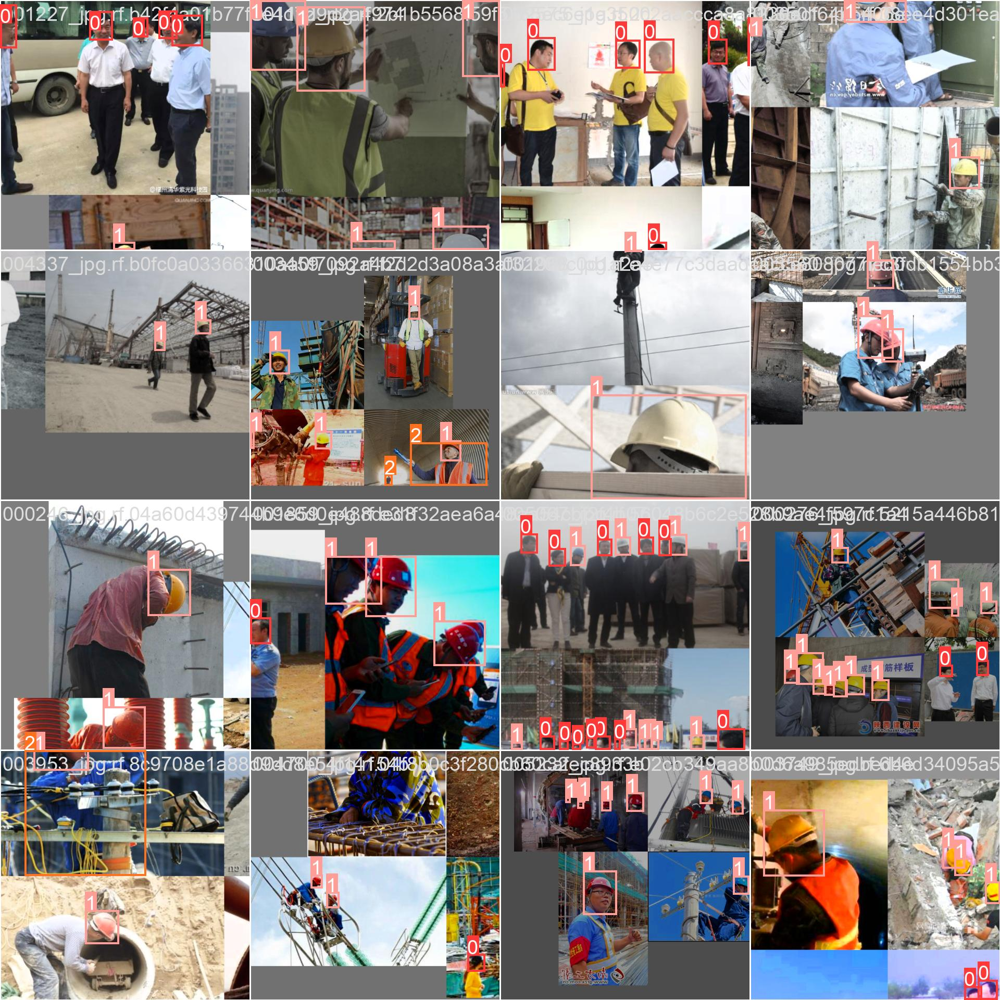

In [22]:
Image(filename='/content/yolov5/runs/train/hardhat_result2/train_batch0.jpg', width=1500)

## 결과물 확인

In [23]:
!pip install -U yt-dlp
!yt-dlp -f 'best[ext=mp4]' --output "input_video.mp4" "https://www.youtube.com/watch?v=Wp74i9_tnls"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 90.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 22.0 MB/s eta 0:00:00
[youtube] Extracting URL: https://www.youtube.com/watch?v=Wp74i9_tnls
[youtube] Wp74i9_tnls: Downloading webpage
[youtube] Wp74i9_tnls: Downloading ios player API JSON
[youtube] Wp74i9_tnls: Downloading android player API JSON
[youtube] Wp74i9_tnls: Downloading player 8fc6998a
[youtube] Wp74i9_tnls: Downloading m3u8 information
[info] Wp74i9_tnls: Downloading 1 format(s): 18
[download] Destination: input_video.mp4
[download] 100% of   11.32MiB in 00:00:00 at 23.66MiB/s


In [24]:
%pwd

'/content/yolov5'

In [25]:
!python detect.py --weights /content/yolov5/runs/train/hardhat_result2/weights/best.pt --img 640 --conf 0.25 --source input_video.mp4

detect: weights=['/content/yolov5/runs/train/hardhat_result2/weights/best.pt'], source=input_video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/4347) /content/yolov5/input_video.mp4: 384x640 (no detections), 86.4ms
video 1/1 (2/4347) /content/yolov5/input_video.mp4: 384x640 (no detections), 8.7ms
video 1/1 (3/4347) /content/yolov5/input_video.mp4: 384x640 (no detections), 9.2ms
video 1/1 (4/4347) /content/yolov5/input_video

## 모델 다운로드

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [27]:
%mkdir /content/drive/MyDrive/hardhat

In [28]:
%cd /content/drive/MyDrive/hardhat

/content/drive/MyDrive/hardhat


In [29]:
%cp /content/yolov5/runs/train/hardhat_result2/weights/best.pt /content/drive/MyDrive/hardhat